#### Project Title : Clustering textual customer feedback to understand customers’ needs and areas for Improvement


In [1]:
## ---------------------------    Project Notebook      -------------------------##
##    Please run cells in sequence as some variables are inherited from previous cells
## ---------------------------Import Libraries-----------------------------------##
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)

import numpy as np
import matplotlib.pyplot as plt
from matplotlib.offsetbox import OffsetImage, AnnotationBbox
import math
import pandas as pd
import random
from sklearn.model_selection import train_test_split
from sklearn import tree
from sklearn.preprocessing import StandardScaler
from sklearn import metrics
from sklearn.ensemble import RandomForestClassifier
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.decomposition import TruncatedSVD
from sklearn.cluster import KMeans
from sklearn.mixture import GaussianMixture
from wordcloud import WordCloud

#--------------------------- Text processing libraries -------------------#
import nltk
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from nltk.stem import PorterStemmer
import re

#nltk.download('stopwords')
#nltk.download('punkt')
#nltk.download('wordnet')

### Important
The data file is not attached due to it's large size. To run this notebook, please:
- download 'complaints.csv.zip' from https://catalog.data.gov/dataset/consumer-complaint-database
- unzip in the same folder as this notebook

### Data cleaning
Loading the source file and showing the first few records

In [2]:
df = pd.read_csv('complaints.csv')
df.head(20)

,Date received,Product,Sub-product,Issue,Sub-issue,Consumer complaint narrative,Company public response,Company,State,ZIP code,Tags,Consumer consent provided?,Submitted via,Date sent to company,Company response to consumer,Timely response?,Consumer disputed?,Complaint ID
0,2020-11-18,Debt collection,Medical debt,Attempts to collect debt not owed,Debt was paid,NaN,Company believes it acted appropriately as aut...,"Eastern Account Systems of Connecticut, Inc.",MA,023XX,NaN,NaN,Web,2020-11-18,Closed with explanation,Yes,NaN,3962269
1,2019-09-24,Debt collection,I do not know,Attempts to collect debt not owed,Debt is not yours,transworld systems inc. \nis trying to collect...,NaN,TRANSWORLD SYSTEMS INC,FL,335XX,NaN,Consent provided,Web,2019-09-24,Closed with explanation,Yes,NaN,3384392
2,2019-09-19,"Credit reporting, credit repair services, or o...",Credit reporting,Incorrect information on your report,Information belongs to someone else,NaN,Company has responded to the consumer and the ...,Experian Information Solutions Inc.,PA,15206,NaN,Consent not provided,Web,2019-09-20,Closed with non-monetary relief,Yes,NaN,3379500
3,2019-11-08,Debt collection,I do not know,Communication tactics,Frequent or repeated calls,"Over the past 2 weeks, I have been receiving e...",NaN,"Diversified Consultants, Inc.",NC,275XX,NaN,Consent provided,Web,2019-11-08,Closed with explanation,Yes,NaN,3433198
4,2020-11-08,"Money transfer, virtual currency, or money ser...",Mobile or digital wallet,"Managing, opening, or closing your mobile wall...",NaN,NaN,NaN,"Paypal Holdings, Inc",IL,618XX,NaN,NaN,Web,2020-11-08,Closed with explanation,Yes,NaN,3942974
5,2019-09-15,Debt collection,Other debt,Attempts to collect debt not owed,Debt was result of identity theft,Pioneer has committed several federal violatio...,NaN,Pioneer Capital Solutions Inc,CA,925XX,NaN,Consent provided,Web,2019-09-15,Closed with explanation,Yes,NaN,3374555
6,2020-11-13,"Credit reporting, credit repair services, or o...",Credit reporting,Problem with a credit reporting company's inve...,Was not notified of investigation status or re...,NaN,NaN,"EQUIFAX, INC.",FL,322XX,Servicemember,NaN,Web,2020-11-13,Closed with explanation,Yes,NaN,3953020
7,2020-11-19,Checking or savings account,CD (Certificate of Deposit),Closing an account,Funds not received from closed account,NaN,NaN,ALLY FINANCIAL INC.,CA,95670,Servicemember,NaN,Web,2020-11-19,In progress,Yes,NaN,3962792
8,2019-07-26,"Credit reporting, credit repair services, or o...",Credit reporting,Problem with a credit reporting company's inve...,Their investigation did not fix an error on yo...,"Previously, on XX/XX/XXXX, XX/XX/XXXX, and XX/...",Company has responded to the consumer and the ...,Experian Information Solutions Inc.,CA,914XX,NaN,Consent provided,Web,2019-07-26,Closed with explanation,Yes,NaN,3319331
9,2019-07-08,"Credit reporting, credit repair services, or o...",Credit reporting,Problem with a credit reporting company's inve...,Their investigation did not fix an error on yo...,Hello This complaint is against the three cred...,Company has responded to the consumer and the ...,"TRANSUNION INTERMEDIATE HOLDINGS, INC.",NY,109XX,NaN,Consent provided,Web,2019-07-08,Closed with explanation,Yes,NaN,3299394


Showing information on columns

In [3]:
print(df.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1847250 entries, 0 to 1847249
Data columns (total 18 columns):
 #   Column                        Dtype 
---  ------                        ----- 
 0   Date received                 object
 1   Product                       object
 2   Sub-product                   object
 3   Issue                         object
 4   Sub-issue                     object
 5   Consumer complaint narrative  object
 6   Company public response       object
 7   Company                       object
 8   State                         object
 9   ZIP code                      object
 10  Tags                          object
 11  Consumer consent provided?    object
 12  Submitted via                 object
 13  Date sent to company          object
 14  Company response to consumer  object
 15  Timely response?              object
 16  Consumer disputed?            object
 17  Complaint ID                  int64 
dtypes: int64(1), object(17)
memory usage: 253.

Find out which columns has missing data and the quantum

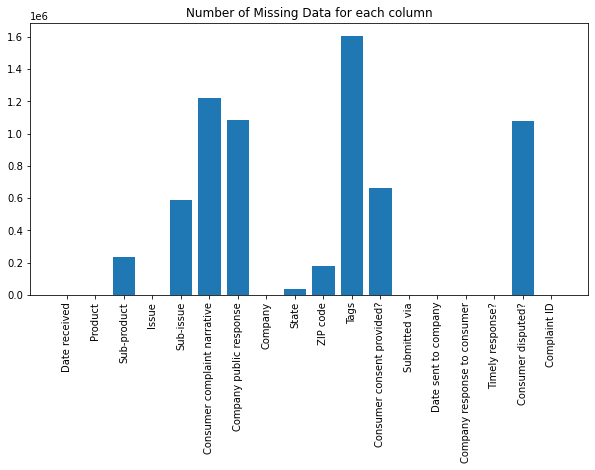

In [4]:
col_names = list(df)

col_miss = []
for col in col_names:
    col_miss.append(df[col].isna().sum())

plt.figure(figsize=(10,5))
plt.bar(col_names,col_miss)
plt.title("Number of Missing Data for each column")
plt.xticks(rotation=90)
plt.show()

A huge proportion of the records have blank customer narrative. The project focus is on text classification. Therefore, I will only extract rolls with text narrative

In [ ]:
df_text = df[df["Consumer complaint narrative"].notnull()]    # Retain only all records with non-blank customer narrative

#------------- More data cleaning --------------------#

df_text["Date received"] = pd.to_datetime(df_text["Date received"])   # Convert string to datetime


Check for missing data again after extracting only those records with full text complaint narrative.

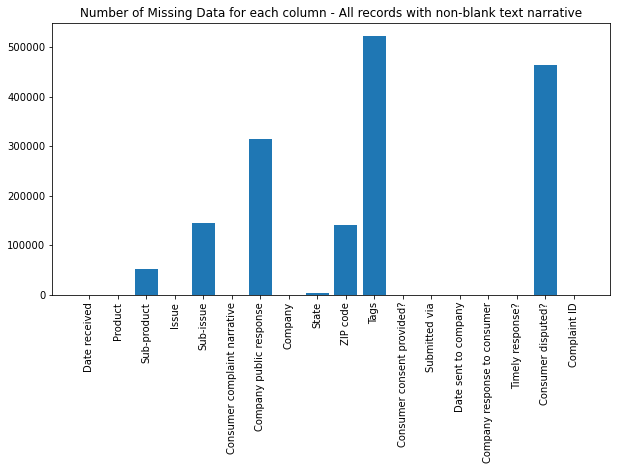

In [6]:
col_miss = []
for col in col_names:
    col_miss.append(df_text[col].isna().sum())

plt.figure(figsize=(10,5))
plt.bar(col_names,col_miss)
plt.title("Number of Missing Data for each column - All records with non-blank text narrative")
plt.xticks(rotation=90)
plt.show()

Plotting number of complaints (with narrative only) received over time

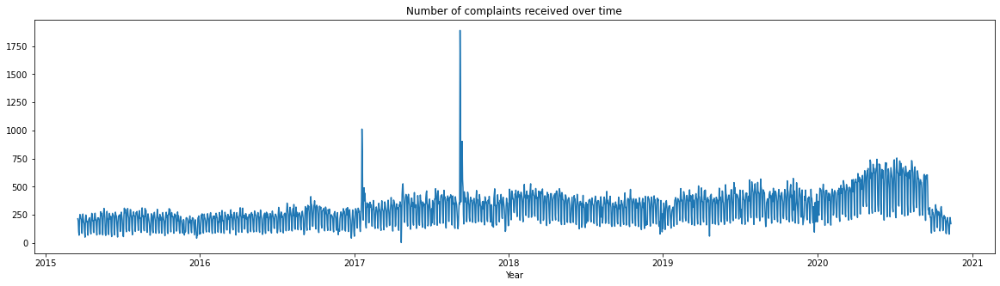

In [7]:
plt.figure(figsize=(20,5))
s = df_text["Date received"].value_counts().sort_index()
plt.plot(s)
plt.xlabel("Year")
plt.title("Number of complaints received over time")
plt.show()

I think it make sense to cluster text separately for each FI institution as nature of complaints are very specific to each company. The following are the list of companies with most number of complaints.

In [9]:
print(df_text['Company'].value_counts()[:50])
print(len(df_text['Company'].value_counts()))


EQUIFAX, INC.                              71744
Experian Information Solutions Inc.        67861
TRANSUNION INTERMEDIATE HOLDINGS, INC.     64770
CITIBANK, N.A.                             20009
WELLS FARGO & COMPANY                      18938
JPMORGAN CHASE & CO.                       18901
BANK OF AMERICA, NATIONAL ASSOCIATION      18814
CAPITAL ONE FINANCIAL CORPORATION          16975
Navient Solutions, LLC.                    15304
SYNCHRONY FINANCIAL                        10987
AMERICAN EXPRESS COMPANY                    7146
U.S. BANCORP                                6336
Ocwen Financial Corporation                 6144
PORTFOLIO RECOVERY ASSOCIATES INC           6068
NATIONSTAR MORTGAGE                         5838
AES/PHEAA                                   5781
DISCOVER BANK                               4953
ENCORE CAPITAL GROUP INC.                   4947
Alliance Data Card Services                 4887
PNC Bank N.A.                               4885
Paypal Holdings, Inc

Subroutines for text-preprocessing

In [12]:
%%capture
#------------------------------ sub routines -------------------------------#

#----------------------------- remove stop words, punctuation, and xxxx plus lemmatization ----------#
def text_prep(narrative):
    #print(narrative)
    #print('-------------------------------------------------------------------------')
    narrative = narrative.lower()
    #stop_words = set(stopwords.words('english'))   use customized stop words
    stop_words = ['transunion','citibank','citi','wells','fargo','jpmorgan','boa','america','bank of america','capital','capital one','navient','synchrony','experian','equifax','hi',"needn't", 'doing', 'its', 'just', "weren't",'i', "should've", 'here', 'were', "shan't", 'is', 'from', 'where', 'more', 'while', 'same', "haven't", 'shan', "hasn't", 'himself', "isn't", 'yourselves', "hadn't", 'them', 'by', "wasn't", 'an', 'only', 'with', 'once', "doesn't", 'about', 'yourself', 'he', 'of', 'll', 'mightn', 'so', 'should', 'have', 'they', "you're", "shouldn't", 'his', 'up', 'ain', "it's", 'you', 'again', 'don', 'hers', 'she', "couldn't",'those', 'being', 'few', 'no', 're', 'isn', 'these', 'the', 'having', 'for', 'hasn', 'during', "that'll", 'has', 'such', 'him', 'mustn', "don't",'haven', 'won', "you'll", 's', "didn't", 'down', 've', 'all', 'been', 'weren', 'a', 'now', 'can', 'couldn', 'do', 'until', 'needn', 'doesn', 'was', 'than', 'm', 'o', 'will', "you'd", 'who', 'did', 'yours', 'we', 'hadn', 'out', 'wouldn', 'each', 'into', 'if', 't', 'both', 'then', 'shouldn', 'it', 'whom', 'your', 'this', 'had', 'myself', 'and', 'before', 'd', 'ourselves', 'didn', 'on', 'why', 'are', 'but', 'ma', 'does', 'there', 'me', 'their', "you've", 'very', 'any', 'further', 'be', 'wasn', 'her', 'which', 'that', 'am', 'or', 'off', 'own', "mightn't", 'how', 'aren', 'to', 'nor', 'too', "wouldn't", 'what', 'because', "won't", 'some', 'y', 'itself', 'themselves', 'at', "she's", 'as', 'over']

    word_tokens = word_tokenize(narrative)
    lemma = nltk.wordnet.WordNetLemmatizer()
    
    #print("word token:",word_tokens)
    punc = ['!','(',')','-','[',']','{','}',';',':','"','\'\'','"','``','\\',',','<','>','.','/','?','@','#','$','%','^','&','*','_','~']
    
    digit = re.compile('\d')   #regex for digits

    filtered_sentence = []

    for w in word_tokens:
        # not stop words, punctuation, does not contain digits
        if w not in stop_words and w not in punc and not bool(digit.search(w)) and 'xxx' not in w: 
            filtered_sentence.append(lemma.lemmatize(w))
    return ' '.join(filtered_sentence)

def vectorize(full_text):
    ct_vec = TfidfVectorizer(full_text, ngram_range=(1,2), preprocessor=text_prep, max_df = 0.85,min_df=0.05,max_features=10000)
    ct_vec1 = ct_vec.fit_transform(full_text)
    new_df = pd.DataFrame(data=ct_vec1.toarray(),columns=ct_vec.get_feature_names())
    return new_df


In [ ]:
#---------- Find best k via 'elbow' method ---------------#

coy = ["EQUIFAX, INC."]


for c in coy:
    df_coy = df_text[df_text['Company']== c]
    df_coy.reset_index(drop=True, inplace=True)
    all_narrative = list(df_coy['Consumer complaint narrative'])

    df_tfidf = vectorize(all_narrative);
    # --------- Reduce dimensionality -----------------------#
    random.seed(0)
    tsvd = TruncatedSVD(n_components=2, random_state=0)       #TSVD is better for sparce matrix compared to PCA
    tsvd_tfidf = tsvd.fit_transform(df_tfidf)



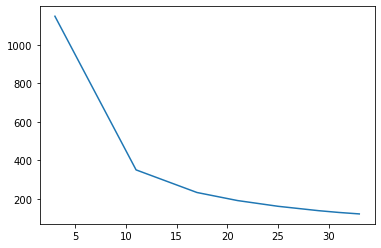

In [15]:
    # --------------- Iterate through different k for Kmeans --------------------#
    ssd = []
    k_values = [3,11,17,21,25,29,31,33]
    for k in k_values:
        model = KMeans(n_clusters=k,random_state=0)
        ypred = model.fit_predict(tsvd_tfidf)
        ssd.append(model.inertia_)

    plt.plot(k_values,ssd)
    plt.show()

The above chart appears to imply that an optimal k could be 17 or 21. However, after evaluating the word clouds for 17 clusters, most showed similar key words. Therefore, to keep the clusters more distinctive from one another, I choose a smaller number of clusters at 5.

(71744, 2)


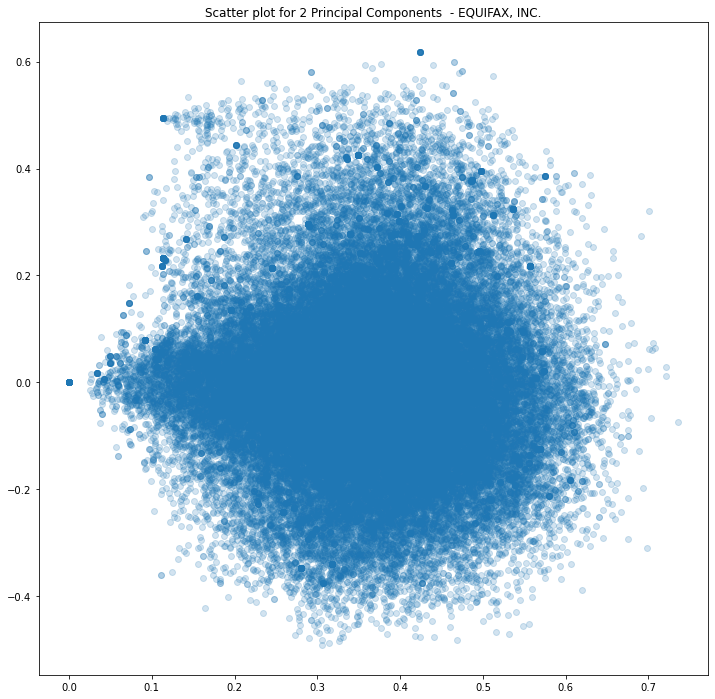

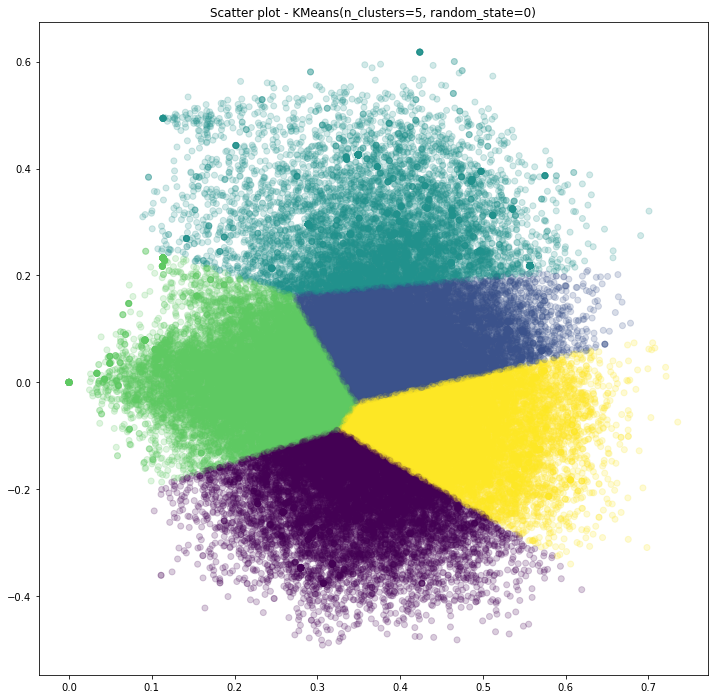

---------------------------  Cluster  0  --------------------------------
    Cluster size :  11661      Percentage :  0.16253623996431757


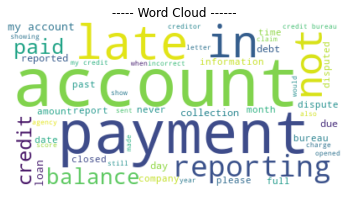

---------------------------  Cluster  1  --------------------------------
    Cluster size :  17742      Percentage :  0.24729594112399644


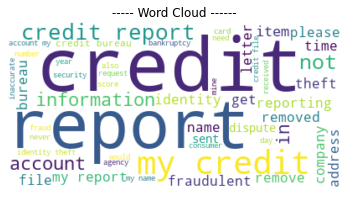

---------------------------  Cluster  2  --------------------------------
    Cluster size :  9129      Percentage :  0.12724409009812668


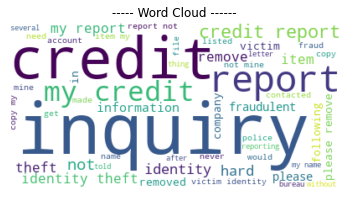

---------------------------  Cluster  3  --------------------------------
    Cluster size :  18248      Percentage :  0.2543487957181088


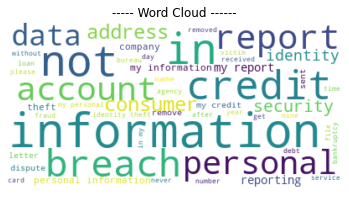

---------------------------  Cluster  4  --------------------------------
    Cluster size :  14964      Percentage :  0.2085749330954505


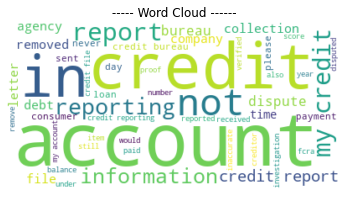

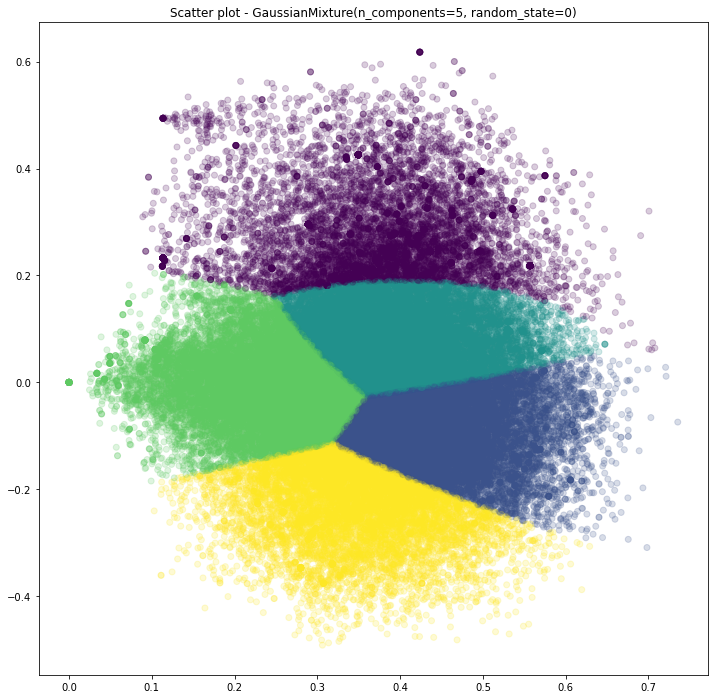

---------------------------  Cluster  0  --------------------------------
    Cluster size :  9165      Percentage :  0.12774587421944691


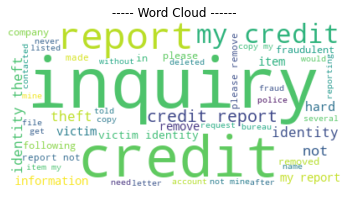

---------------------------  Cluster  1  --------------------------------
    Cluster size :  15291      Percentage :  0.2131328055307761


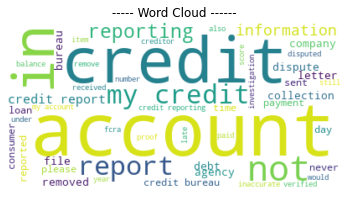

---------------------------  Cluster  2  --------------------------------
    Cluster size :  18589      Percentage :  0.25910180642283676


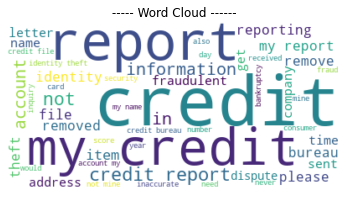

---------------------------  Cluster  3  --------------------------------
    Cluster size :  18208      Percentage :  0.2537912578055308


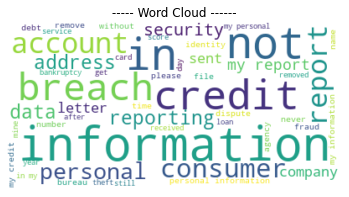

---------------------------  Cluster  4  --------------------------------
    Cluster size :  10491      Percentage :  0.14622825602140946


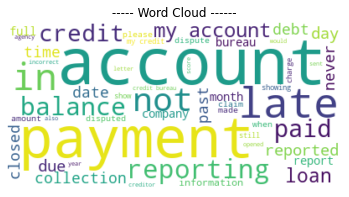

In [17]:
# Select only the institutes with top 10 complaints
coy = ["EQUIFAX, INC."]


for c in coy:
    df_coy = df_text[df_text['Company']== c]
    df_coy.reset_index(drop=True, inplace=True)
    all_narrative = list(df_coy['Consumer complaint narrative'])

    df_tfidf = vectorize(all_narrative);
    # --------- Reduce dimensionality -----------------------#
    random.seed(0)
    tsvd = TruncatedSVD(n_components=2, random_state=0)       #TSVD is better for sparce matrix compared to PCA
    tsvd_tfidf = tsvd.fit_transform(df_tfidf)

    # --------- Show scatter plot of 2 principal components before clustering --------- #
    print(tsvd_tfidf.shape)
    plt.figure(figsize=(12,12))
    plt.scatter(tsvd_tfidf[:,0],tsvd_tfidf[:,1],alpha=0.2)
    title = 'Scatter plot for 2 Principal Components  - '+c
    plt.title(title)
    plt.show()
    
    # --------------- Iterate through models --------------------#
    models = [KMeans(n_clusters=5,random_state=0),GaussianMixture(n_components=5,covariance_type='full',random_state=0)]
    for model in models:
        ypred = model.fit_predict(tsvd_tfidf)
        clust_id = set(ypred)
        # ----- show scatter plot after clustering ----- #
        plt.figure(figsize=(12,12))
        plt.scatter(tsvd_tfidf[:,0],tsvd_tfidf[:,1],alpha=0.2,c=ypred,cmap='viridis')
        plt.title('Scatter plot - '+str(model))
        plt.show()

        for cc in clust_id:
            cl_terms = df_tfidf[ypred==cc]
            cl_size = len(cl_terms)
            print('--------------------------- ','Cluster ',str(cc),' --------------------------------')
            print('    Cluster size : ',cl_size,'     Percentage : ',cl_size/len(df_tfidf))
            cl_terms_sum = cl_terms.T.sum(axis=1)

            Cloud = WordCloud(background_color="white", max_words=50).generate_from_frequencies(cl_terms_sum)

            plt.imshow(Cloud, interpolation='bilinear')
            plt.title(' ----- Word Cloud ------ ')
            plt.axis("off")
            plt.show()



---------------------------------  Experian Information Solutions Inc.  ---------------------------------
(67861, 2)


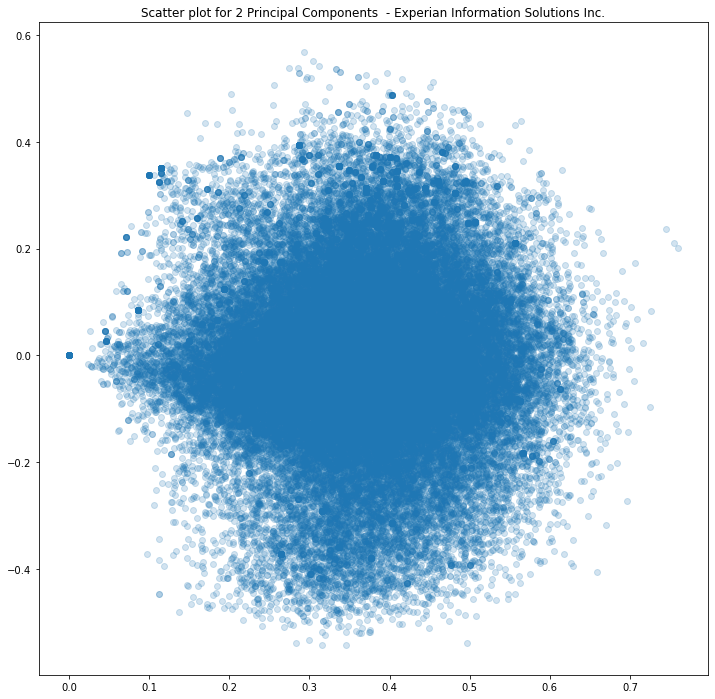

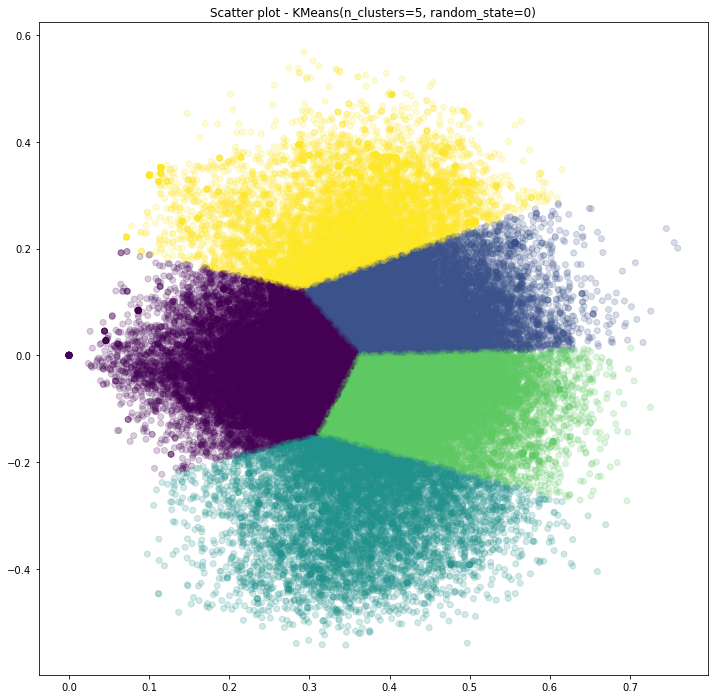

---------------------------  Cluster  0  --------------------------------
    Cluster size :  17974      Percentage :  0.26486494451894316


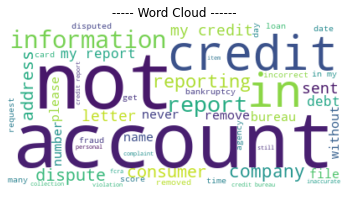

---------------------------  Cluster  1  --------------------------------
    Cluster size :  15025      Percentage :  0.22140846730817407


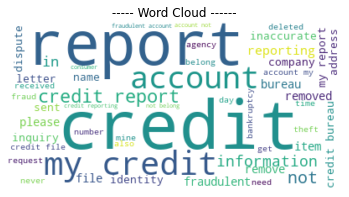

---------------------------  Cluster  2  --------------------------------
    Cluster size :  8303      Percentage :  0.12235304519532574


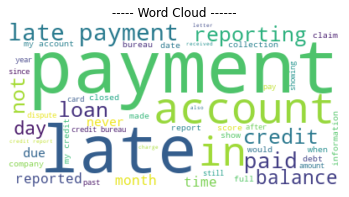

---------------------------  Cluster  3  --------------------------------
    Cluster size :  16372      Percentage :  0.24125786534239108


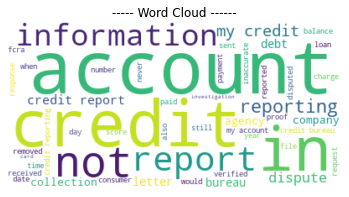

---------------------------  Cluster  4  --------------------------------
    Cluster size :  10187      Percentage :  0.150115677635166


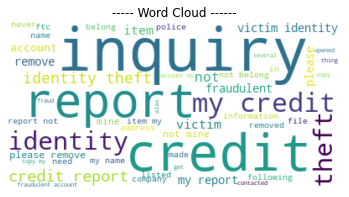

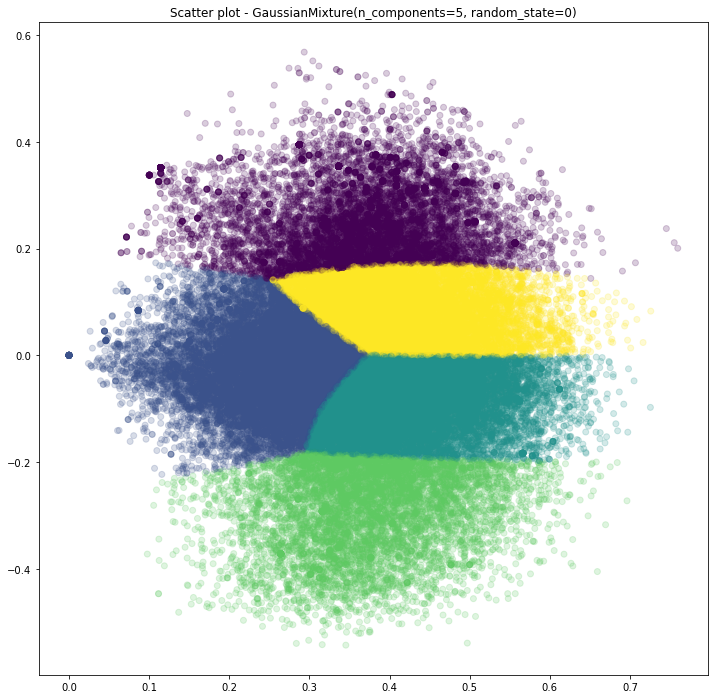

---------------------------  Cluster  0  --------------------------------
    Cluster size :  10725      Percentage :  0.15804364804526902


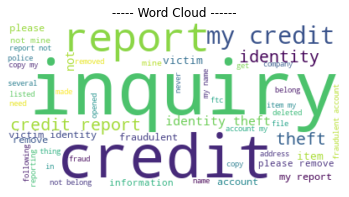

---------------------------  Cluster  1  --------------------------------
    Cluster size :  17332      Percentage :  0.25540442964294663


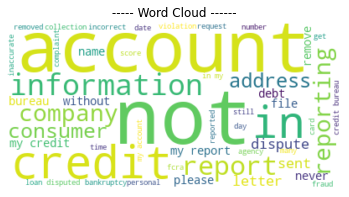

---------------------------  Cluster  2  --------------------------------
    Cluster size :  16517      Percentage :  0.24339458599195415


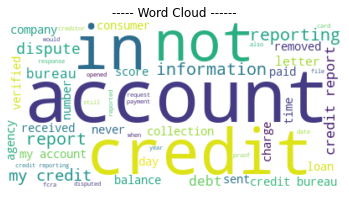

---------------------------  Cluster  3  --------------------------------
    Cluster size :  7836      Percentage :  0.11547133110328466


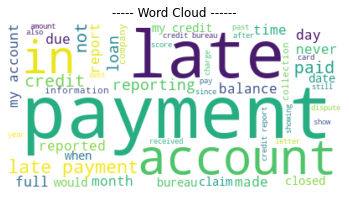

---------------------------  Cluster  4  --------------------------------
    Cluster size :  15451      Percentage :  0.22768600521654558


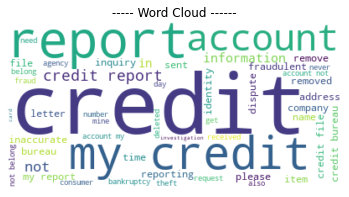

---------------------------------  TRANSUNION INTERMEDIATE HOLDINGS, INC.  ---------------------------------
(64770, 2)


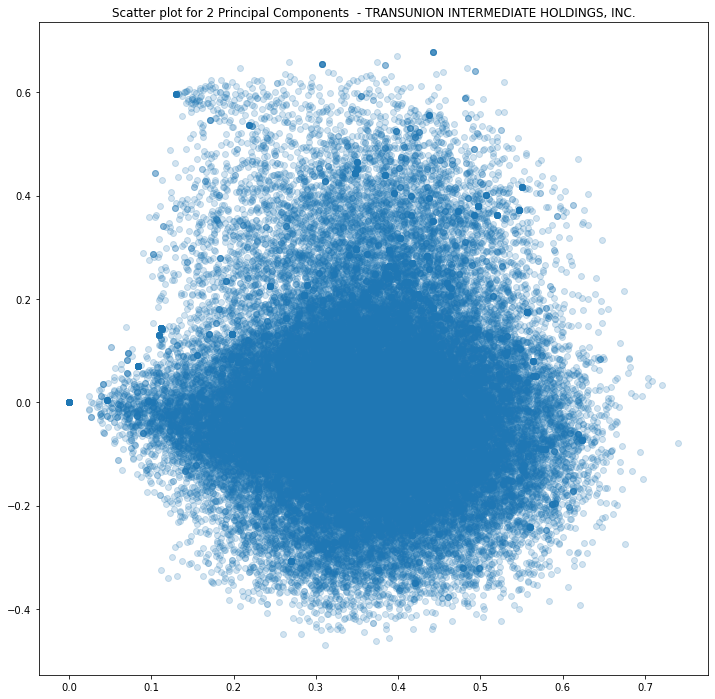

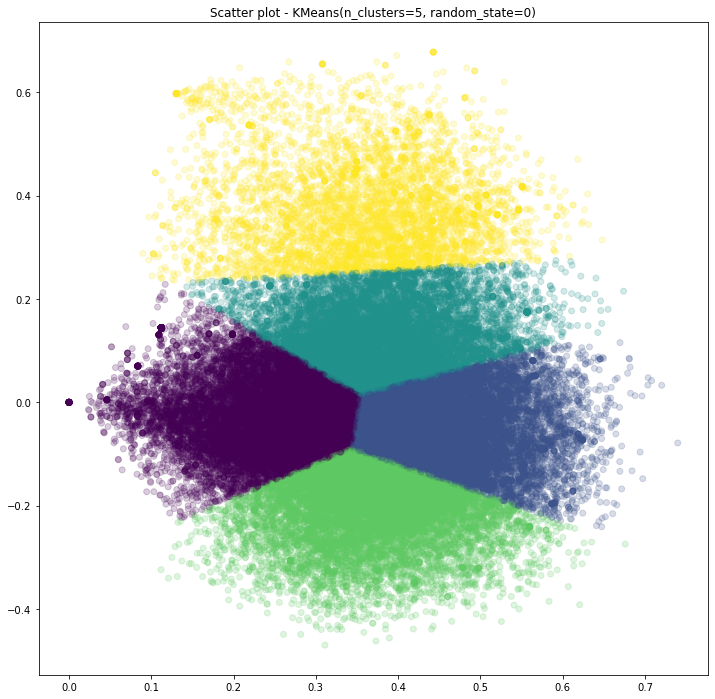

---------------------------  Cluster  0  --------------------------------
    Cluster size :  16260      Percentage :  0.25104214914312184


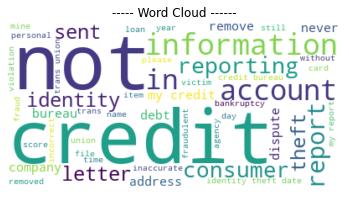

---------------------------  Cluster  1  --------------------------------
    Cluster size :  16050      Percentage :  0.24779990736452062


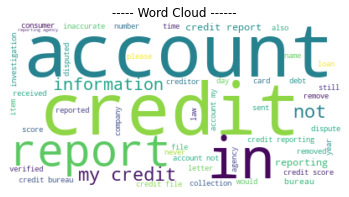

---------------------------  Cluster  2  --------------------------------
    Cluster size :  14007      Percentage :  0.21625752663270031


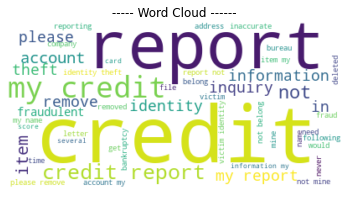

---------------------------  Cluster  3  --------------------------------
    Cluster size :  13004      Percentage :  0.20077196232823838


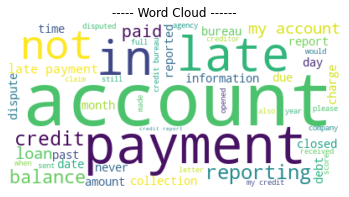

---------------------------  Cluster  4  --------------------------------
    Cluster size :  5449      Percentage :  0.08412845453141887


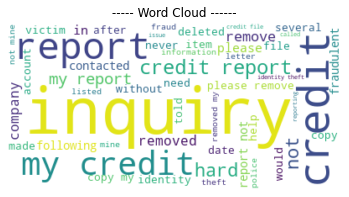

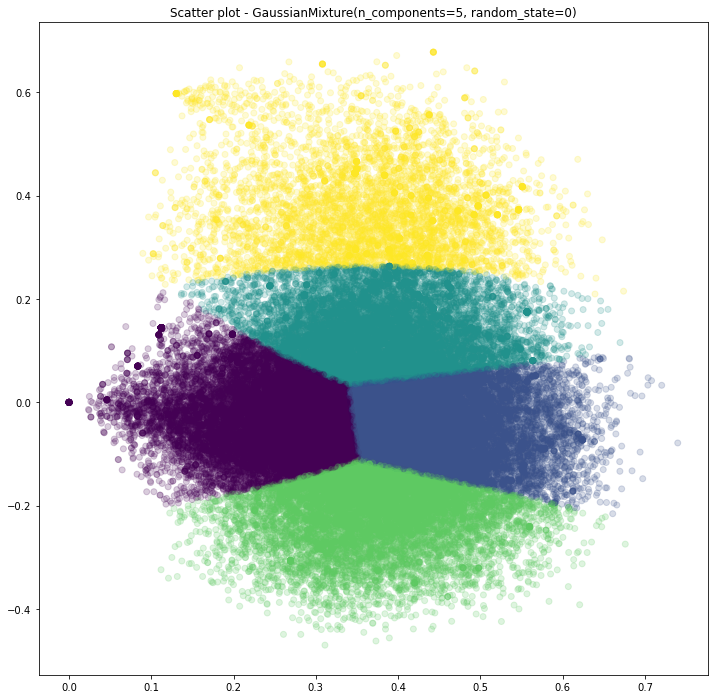

---------------------------  Cluster  0  --------------------------------
    Cluster size :  16682      Percentage :  0.25755751119345377


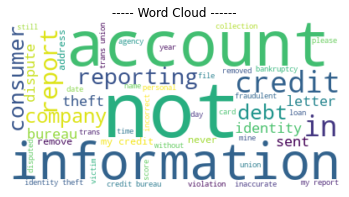

---------------------------  Cluster  1  --------------------------------
    Cluster size :  16918      Percentage :  0.2612011733827389


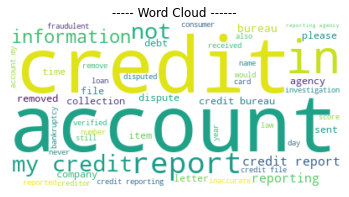

---------------------------  Cluster  2  --------------------------------
    Cluster size :  13860      Percentage :  0.21398795738767948


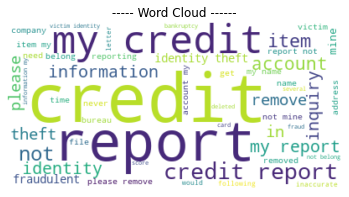

---------------------------  Cluster  3  --------------------------------
    Cluster size :  12026      Percentage :  0.18567237918789564


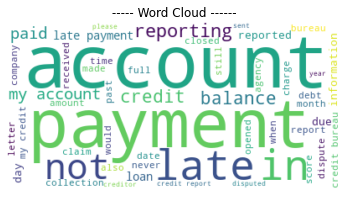

---------------------------  Cluster  4  --------------------------------
    Cluster size :  5284      Percentage :  0.0815809788482322


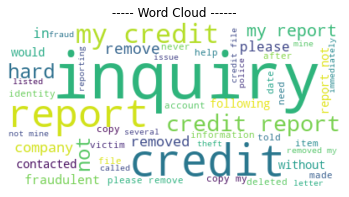

---------------------------------  CITIBANK, N.A.  ---------------------------------
(20009, 2)


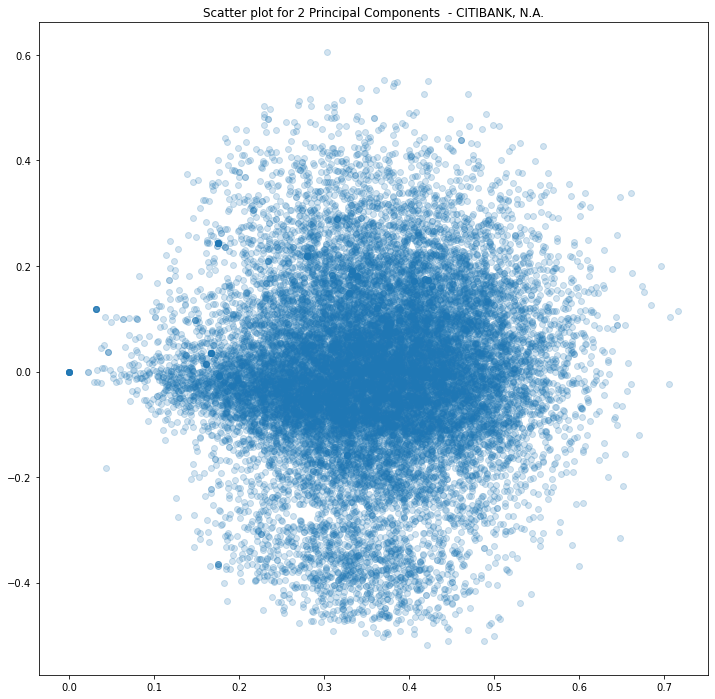

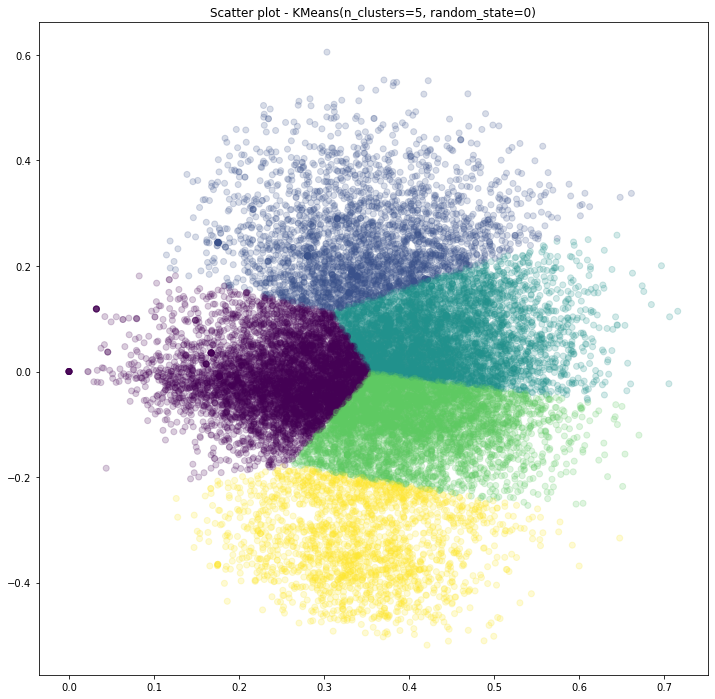

---------------------------  Cluster  0  --------------------------------
    Cluster size :  5415      Percentage :  0.270628217302214


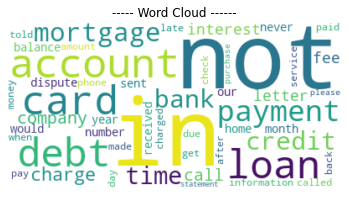

---------------------------  Cluster  1  --------------------------------
    Cluster size :  3054      Percentage :  0.15263131590784146


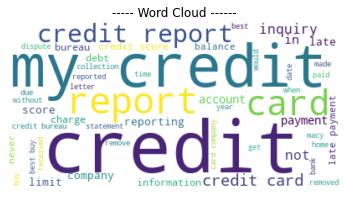

---------------------------  Cluster  2  --------------------------------
    Cluster size :  4922      Percentage :  0.24598930481283424


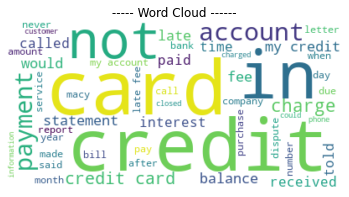

---------------------------  Cluster  3  --------------------------------
    Cluster size :  4687      Percentage :  0.23424458993452946


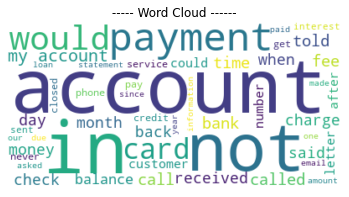

---------------------------  Cluster  4  --------------------------------
    Cluster size :  1931      Percentage :  0.09650657204258084


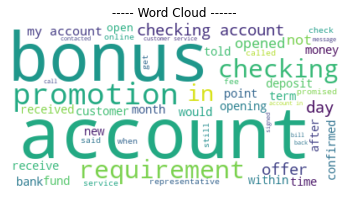

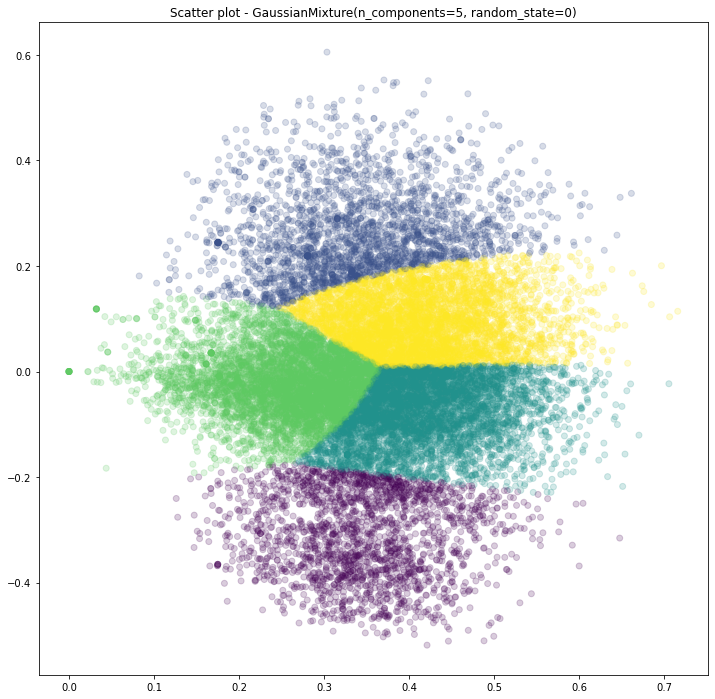

---------------------------  Cluster  0  --------------------------------
    Cluster size :  2098      Percentage :  0.10485281623269528


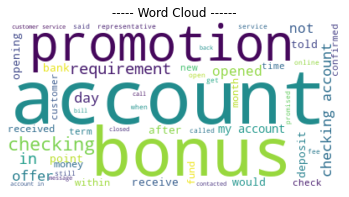

---------------------------  Cluster  1  --------------------------------
    Cluster size :  2531      Percentage :  0.1264930781148483


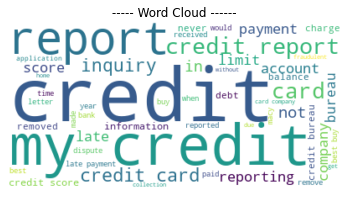

---------------------------  Cluster  2  --------------------------------
    Cluster size :  5036      Percentage :  0.25168674096656507


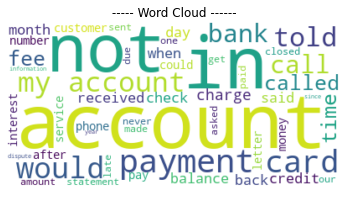

---------------------------  Cluster  3  --------------------------------
    Cluster size :  5456      Percentage :  0.2726772952171523


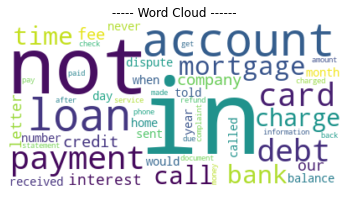

---------------------------  Cluster  4  --------------------------------
    Cluster size :  4888      Percentage :  0.24429006946873907


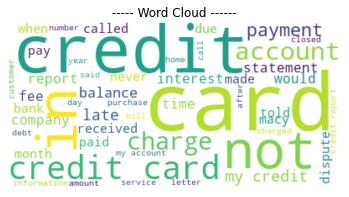

---------------------------------  WELLS FARGO & COMPANY  ---------------------------------
(18938, 2)


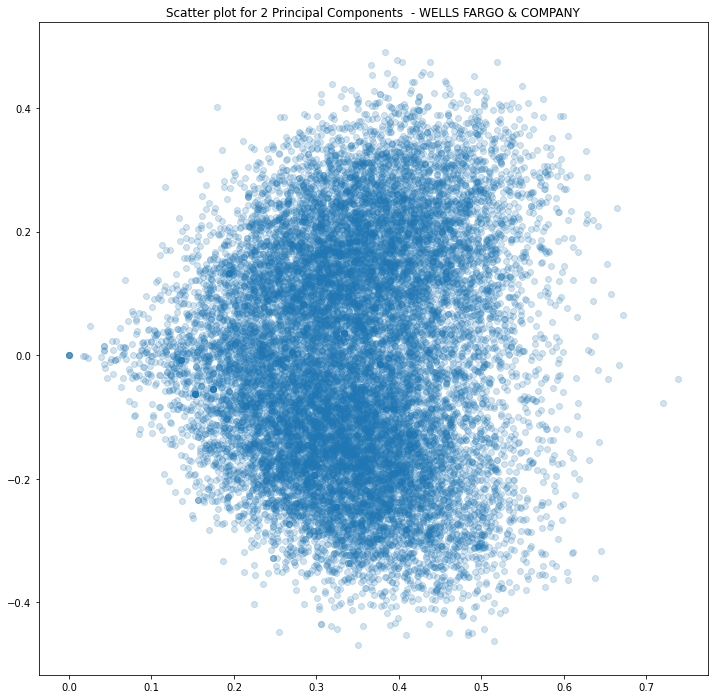

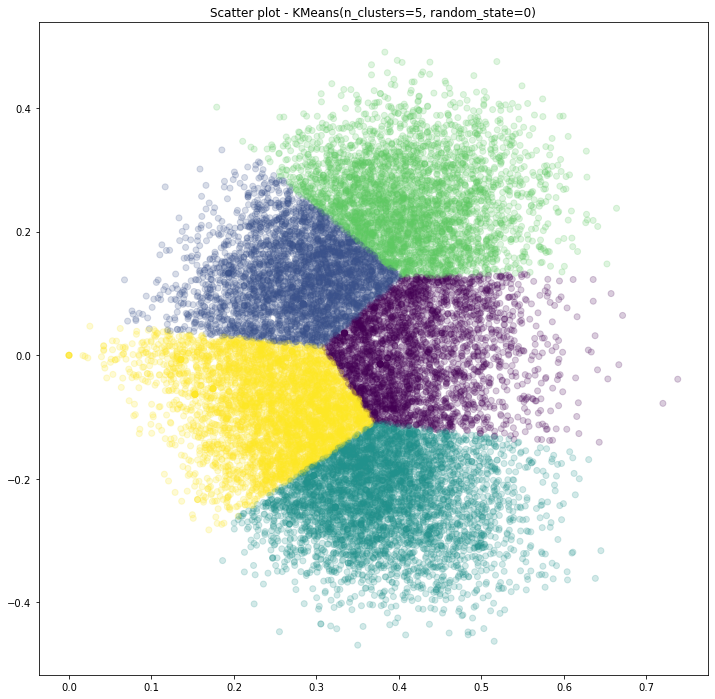

---------------------------  Cluster  0  --------------------------------
    Cluster size :  3020      Percentage :  0.15946773682543036


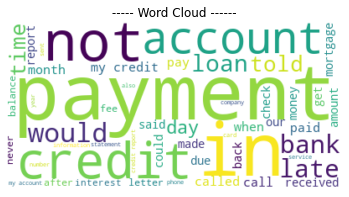

---------------------------  Cluster  1  --------------------------------
    Cluster size :  3689      Percentage :  0.1947935368043088


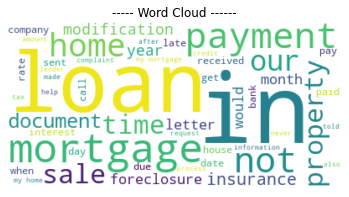

---------------------------  Cluster  2  --------------------------------
    Cluster size :  4492      Percentage :  0.23719505755623613


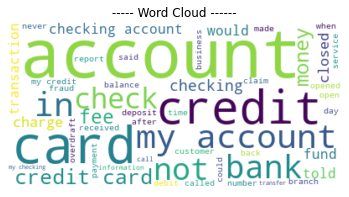

---------------------------  Cluster  3  --------------------------------
    Cluster size :  3475      Percentage :  0.18349350512197699


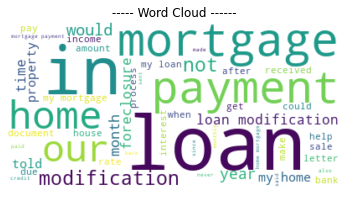

---------------------------  Cluster  4  --------------------------------
    Cluster size :  4262      Percentage :  0.22505016369204772


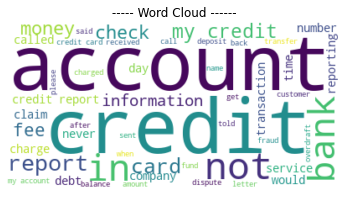

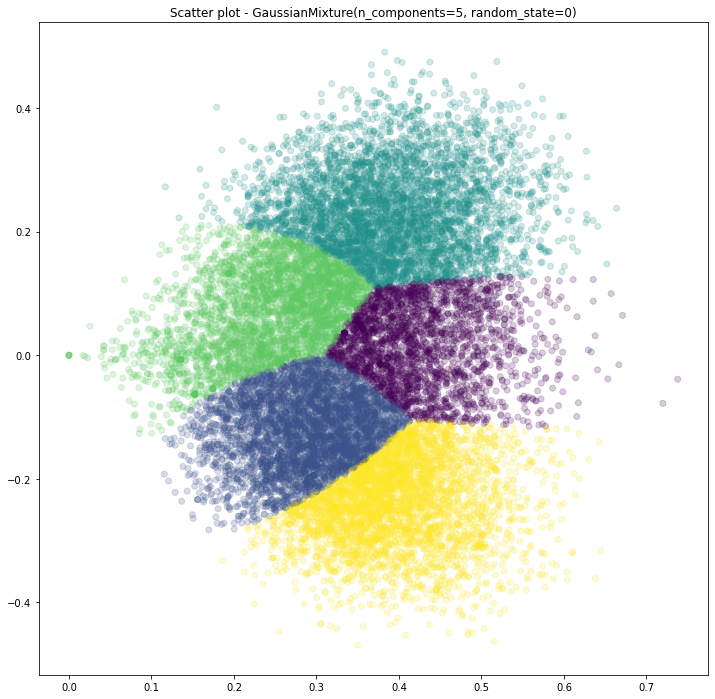

---------------------------  Cluster  0  --------------------------------
    Cluster size :  2565      Percentage :  0.13544196852888374


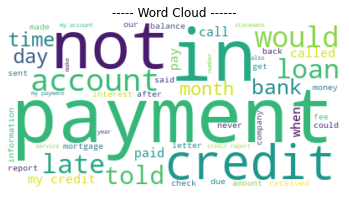

---------------------------  Cluster  1  --------------------------------
    Cluster size :  4471      Percentage :  0.23608617594254938


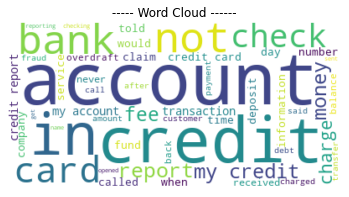

---------------------------  Cluster  2  --------------------------------
    Cluster size :  4521      Percentage :  0.2387263702608512


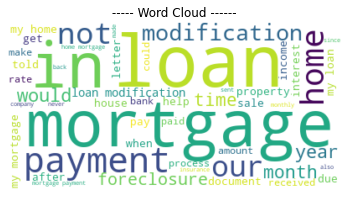

---------------------------  Cluster  3  --------------------------------
    Cluster size :  3657      Percentage :  0.19310381244059563


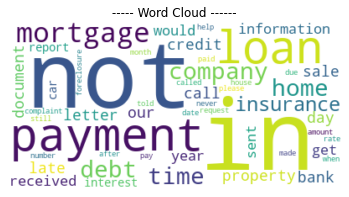

---------------------------  Cluster  4  --------------------------------
    Cluster size :  3724      Percentage :  0.19664167282712008


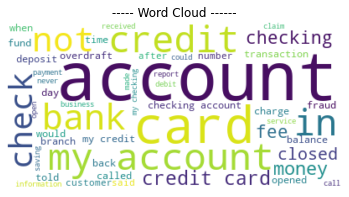

---------------------------------  JPMORGAN CHASE & CO.  ---------------------------------
(18901, 2)


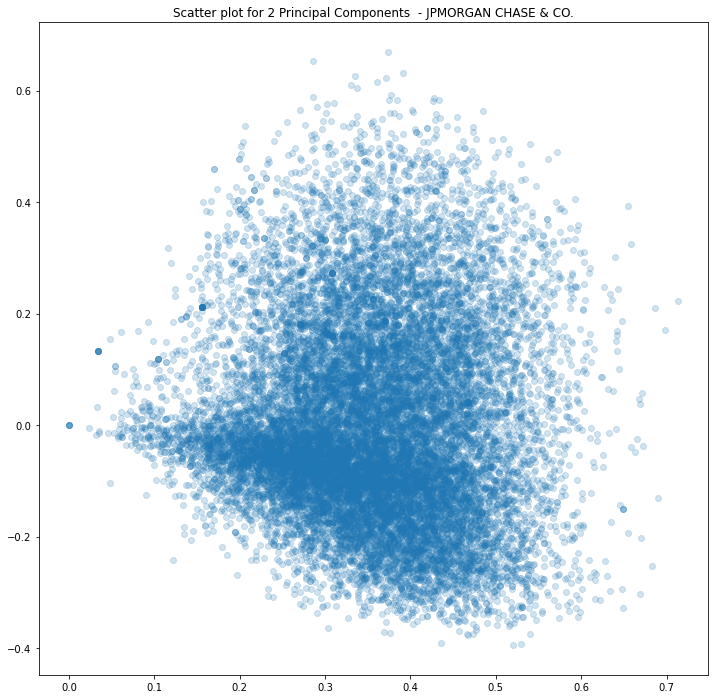

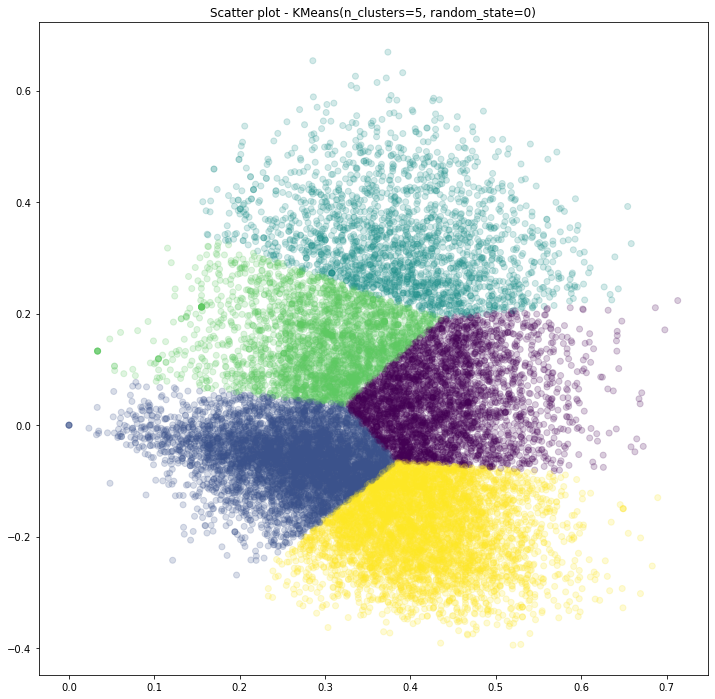

---------------------------  Cluster  0  --------------------------------
    Cluster size :  3441      Percentage :  0.182053859584149


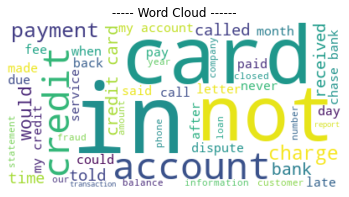

---------------------------  Cluster  1  --------------------------------
    Cluster size :  5546      Percentage :  0.2934236283794508


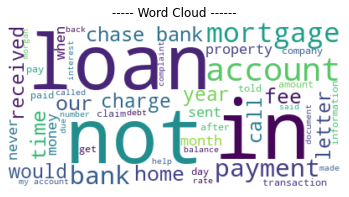

---------------------------  Cluster  2  --------------------------------
    Cluster size :  2117      Percentage :  0.11200465583831544


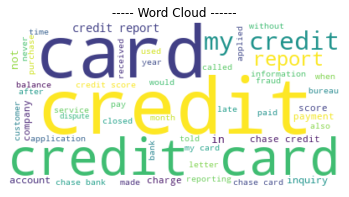

---------------------------  Cluster  3  --------------------------------
    Cluster size :  2836      Percentage :  0.1500449711655468


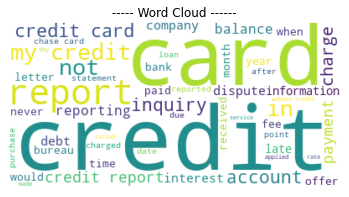

---------------------------  Cluster  4  --------------------------------
    Cluster size :  4961      Percentage :  0.26247288503253796


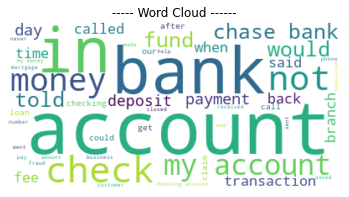

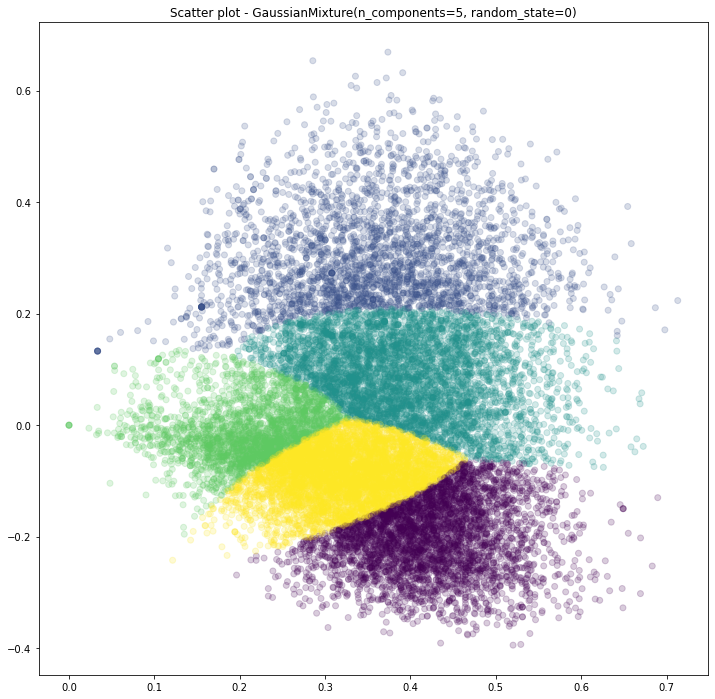

---------------------------  Cluster  0  --------------------------------
    Cluster size :  3818      Percentage :  0.20199989418549283


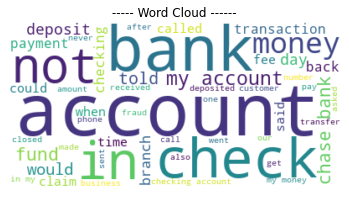

---------------------------  Cluster  1  --------------------------------
    Cluster size :  2807      Percentage :  0.14851066081159728


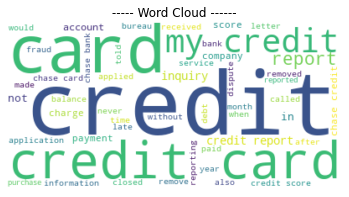

---------------------------  Cluster  2  --------------------------------
    Cluster size :  4717      Percentage :  0.24956351515792816


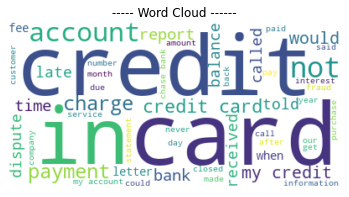

---------------------------  Cluster  3  --------------------------------
    Cluster size :  2451      Percentage :  0.12967567853552722


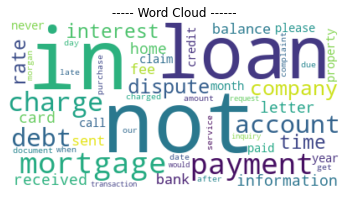

---------------------------  Cluster  4  --------------------------------
    Cluster size :  5108      Percentage :  0.2702502513094545


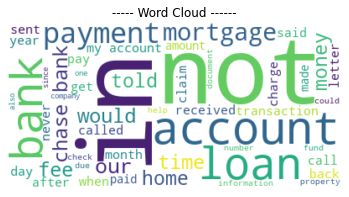

In [16]:
# Run for other 4 companies
coy = ["Experian Information Solutions Inc.","TRANSUNION INTERMEDIATE HOLDINGS, INC.","CITIBANK, N.A.","WELLS FARGO & COMPANY","JPMORGAN CHASE & CO."]

for c in coy:
    print('--------------------------------- ',c,' ---------------------------------')
    df_coy = df_text[df_text['Company']== c]
    df_coy.reset_index(drop=True, inplace=True)
    all_narrative = list(df_coy['Consumer complaint narrative'])

    df_tfidf = vectorize(all_narrative);
    # --------- Reduce dimensionality -----------------------#
    random.seed(0)
    tsvd = TruncatedSVD(n_components=2, random_state=0)       #TSVD is better for sparce matrix compared to PCA
    tsvd_tfidf = tsvd.fit_transform(df_tfidf)

    # --------- Show scatter plot of 2 principal components before clustering --------- #
    print(tsvd_tfidf.shape)
    plt.figure(figsize=(12,12))
    plt.scatter(tsvd_tfidf[:,0],tsvd_tfidf[:,1],alpha=0.2)
    title = 'Scatter plot for 2 Principal Components  - '+c
    plt.title(title)
    plt.show()
    
    # --------------- Iterate through models --------------------#
    models = [KMeans(n_clusters=5,random_state=0),GaussianMixture(n_components=5,covariance_type='full',random_state=0)]
    for model in models:
        ypred = model.fit_predict(tsvd_tfidf)
        clust_id = set(ypred)
        #print("km_pred",km_pred)
        # ----- show scatter plot after clustering ----- #
        plt.figure(figsize=(12,12))
        plt.scatter(tsvd_tfidf[:,0],tsvd_tfidf[:,1],alpha=0.2,c=ypred,cmap='viridis')
        plt.title('Scatter plot - '+str(model))
        plt.show()

        for cc in clust_id:
            cl_terms = df_tfidf[ypred==cc]
            cl_size = len(cl_terms)
            print('--------------------------- ','Cluster ',str(cc),' --------------------------------')
            print('    Cluster size : ',cl_size,'     Percentage : ',cl_size/len(df_tfidf))
            #print('    Top 30 terms with sum TF-IDF : ')
            cl_terms_sum = cl_terms.T.sum(axis=1)
            #print(cl_terms_sum.sort_values(ascending=False)[:30])

            Cloud = WordCloud(background_color="white", max_words=50).generate_from_frequencies(cl_terms_sum)

            plt.imshow(Cloud, interpolation='bilinear')
            plt.title(' ----- Word Cloud ------ ')
            plt.axis("off")
            plt.show()


Decide to ditch Spectral Clustering as it went into memory error as it is computationally expensive. It is not really suitable as the scatter plots shows that there are little well separated clusters